# Introduction 

Fires are known to affect forest ecosystems and drive changes in vegetation, but how does fires affect the lives and environment of people residing in or near these dry vegetation areas? Remote sensing in fire change detection tend to focus heavily on burnt vegetation rather than rural and suburban areas that have also been heavily burned by fires. 

### Outline of the session

In this Notebook, we propose a binary classification method to identify destroyed and unharmed buildings and vegetation using high resolution satellite imagery, image processing, remote sensing, and machine learning. We will go over the following:
* **Evaluate NBR** using Sentinel-2 and WorldView-3 images
* Evaluate and compare our **Random Forest model** to the NBR method
* **Classify buildings** in area of interest are burnt or not burnt and **compare to ground truth map**

### Motivation

Normalized Burned Ratio (NBR) and Difference Normalized Burned Ratio (dNBR) are remote sensing indices that can highlight areas of burned and index the severity of a burn. The formula for NBR [1] is the difference between the near-infrared (NIR) band and the short-wave infrared (SWIR) band in which burnt vegetation tends to have higher reflectance in SWIR. It is not known if burnt urban or suburban areas have high reflectance in SWIR. 

$$NBR= \frac{NIR-SWIR}{NIR+SWIR} \> [1]$$

Because NBR and dNBR require the SWIR band, this algorithm is limited to only using imaging platforms that can capture SWIR (i.e. MODIS, Landsat, Sentinel). Landsat-8 and Sentinel-2 are imaging platforms that have capabilities for capturing SWIR at 30 m and 20 m resolution, respectively. Both of these satellites provide relatively frequent temporal repeat coverage; however, the accuracy of using these imagery sources for assessing forest fire damage to the built environment is limited by the relatively coarse spatial resolution.

DigitalGlobe's [WorldView-3](http://worldview3.digitalglobe.com/) satellite provides Very High Resolution (VHR) data at astounding spatial resolutions of 31 cm for panchromatic, 1.2 m for multispectral, and 3.7 m for SWIR bands. With this high resolution, WorldView-3 images provides the potential for a more precise assessment of forest fire damange than Sentinel and Landsat. However, WorldView-3 SWIR images are not always captured over fire affected areas during the critical post-fire period for damage assessment, so this approach, too, can be limiting.

Because of these limitations, we propose a method that uses WorldView-3 8-band data (i.e., visible and near infrared bands, only)  and machine learning to identify regions of vegetation and urban that are burnt. This approach allows us to leverage the high resolution of WorldView-3, without the dependency on SWIR. In this Notebook, we have trained a Random Forest model over post-fire image of a small area within Napa, Sonoma County affected by a recent wildfire - [the Nuns fire](https://en.wikipedia.org/wiki/October_2017_Northern_California_wildfires#Nuns_Fire) - that started on October 8, 2017 and was contained by October 30, 2017. The Random Forest will perform a binary classification to identify regions and buildings that are destroyed or unharmed.

# Area of Interest: <span style="font-weight:normal">Nuns fire - Sonoma County</span>

To train our Random Forest model, we have selected a small area within Sonoma County that has been affected by the Nuns fire in October 2017. Our area of interest includes both vegetation and buildings that have been destroyed and unharmed.

### Getting Started

To start, we will need to load some dependencies. 

In [1]:
!pip uninstall nbburntbuildings -y

Skipping nbburntbuildings as it is not installed.


In [ ]:
!pip install folium -q
!pip install git+https://github.com/aalten77/nbburntbuildings.git@master -q
!pip install -U scikit-learn -q
!pip install geojson -q
!pip install cython -q

In [3]:
from gbdxtools import Interface, LandsatImage, Sentinel2, CatalogImage
import gbdxtools
from skimage.transform import resize
from skimage.filters import threshold_otsu, gaussian
from skimage.measure import label, regionprops
from skimage import feature, morphology
import rasterio
from rasterio import features
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import shapely
from shapely.geometry import Polygon, mapping, shape, MultiPolygon, box
from shapely.ops import cascaded_union, unary_union
from skimage import transform, feature, segmentation, util, filters, exposure, morphology, data, io, measure, color, img_as_bool
import folium
import nbburntbuildings
import cPickle
import tqdm
from sklearn import ensemble
import json
import os
import geojson
%matplotlib inline
gbdx = Interface()

### Trinity Road

Below is the image of our area of interest in Glen Ellen, CA that has been affected by the Nuns fire. This is just a small part of Sonoma, but it is enough training data to supply to the Random Forest classifier. We used a post-fire image acquired from 3/5/18 as it is representative of what the burnt are will look like after a fire. 

To load this image, the gbdxtools module can create a **CatalogImage** that takes in a catalog id (the satellite image) and a bbox boundary (area of interest). Run the code below to see what this image will look like:

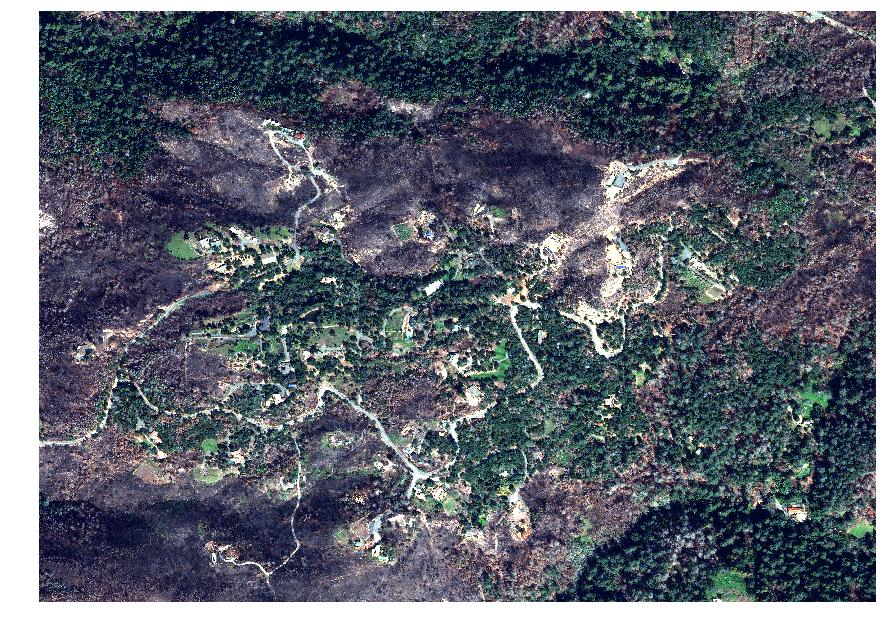

In [4]:
# Nuns Fire (northwest)
catalog_id = '10400100391B4800'
bbox_nuns = (-122.497, 38.383, -122.48, 38.395)

# Access the image as a CatalogImage
image = CatalogImage(catalog_id, band_type="MS", pansharpen=True, bbox=bbox_nuns)

#view the CatalogImage
image.plot(w=15, h=15)

# Building Footprints

Since we have interest in finding which of the buildings on Trinity Road have been destroyed, we will bring in a building footprint dataset that will allow us to identify which of these buildings have been destroyed by the Nuns fire:

You may take a look at the Sonoma County building footprints by clicking this [link](https://sonomacountyopendata-sonomamap.opendata.arcgis.com/datasets/0f5982c3582d4de0b811e68d7f0bff8f_6.geojson). You can view the Geojson in your preferred GIS software. 

First, we will load in the json file of building footprints. We have already recreated a new geojson with buildings within our area of interest. Run the next cell to download the building footprints.

In [5]:
buildings_geojson = json.loads(nbburntbuildings.get_geojson())

Run the following code to visualize your building footprint in Folium maps. You may use your preferred web map API but here we will have a ready-made function for you that can visualize the geojson. 

In [6]:
map_center = box(*bbox_nuns).centroid.coords[0]

tms_url = 'https://s3.amazonaws.com/notebooks-small-tms/10400100391B4800/{z}/{x}/{y}.png' #tms url of the image of our area of interest

nbburntbuildings.folium_map(buildings_geojson, 'Burnt Buildings', location=[map_center[1], map_center[0]], tiles=tms_url, attr='DigitalGlobe', map_zoom=16, height='100%', tms=True, zoom_beyond_max=20, max_zoom=20)

# Method 1: <span style="font-weight:normal">Sentinel-2 NBR</span>

To compare our proposed method to the NBR method, we will provide an example using a Sentinel-2 image of 20m resolution. For this, we have selected a recent post-fire image captured by Sentinel-2 on 6/24/18 over Trinity Rd: 

Again, we will load in our image but this time as a **Sentinel2** object. The ID also have a specific standard that you can find out more about [here](http://sentinel-pds.s3-website.eu-central-1.amazonaws.com/). You must get both the **Sentinel2** object with at 10m and 20m by specificying *spec*. This is because SWIR is captured at 20m resolution and all other multispectral bands are at 10m resolution on Sentinel-2.

In [7]:
post_sentinel_id = 'tiles/10/S/EH/2018/6/24/0'

#SWIR is only captured in '20m' resolution, MS bands in '10m' resolution
post_vnir_sent_img = Sentinel2(post_sentinel_id, spec='10m',  proj="EPSG:4326", bbox=bbox_nuns)
post_swir_sent_img = Sentinel2(post_sentinel_id, spec='20m',  proj="EPSG:4326", bbox=bbox_nuns)

In [8]:
post_sent_nir = post_vnir_sent_img[3,:,:] # NIR band
post_sent_swir = post_swir_sent_img[5,:,:] # SWIR band

#resize swir image to match nir image dimensions
post_sent_swir_rs = resize(post_sent_swir.astype(np.float), post_sent_nir.shape, order=1, mode='constant', clip=True)

Once you have the NIR and SWIR band, you can calculate for **NBR** [1].

In [9]:
#calculate NBR
nbr = np.clip((post_sent_nir - post_sent_swir_rs)/(post_sent_nir + post_sent_swir_rs), -1, 1)

The NBR results in a grayscale image with real numbers ranging from -1 to 1. We will want to turn this into a binary image to classify areas of burnt vs non-burnt. So first after applying some preprocessing steps to the image, we will apply *Otsu's method* with scikit-image method <code>threshold_otsu()</code> to return a threshold and identify burnt vs non-burnt regions. For post-processing we have defined our own <code>clean()</code> method to remove any small holes or objects left in the binary image. 

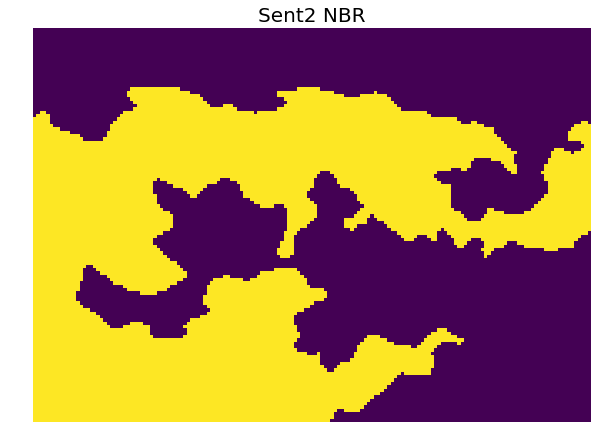

In [10]:
#use Otsu's threshold to identify burnt vs non-burnt regions
nbr = np.array(nbr)
nbr[np.isnan(nbr)] = 0
nbr = gaussian(nbr, preserve_range=True)
thresh = threshold_otsu(nbr)
binary = nbr < thresh 

# clean the binary image
binary = nbburntbuildings.clean(binary)

#see what it looks like
plt.figure(figsize=(10,10))
plt.title("Sent2 NBR", fontsize=20)
plt.axis('off')
plt.imshow(binary)

After obtaining our binary image mask, we will perform _vectorization_ to turn the binary into vector space. You can do this with one of the functions from the Rasterio features module, <code>shapes()</code>. This function will take the binary image, a mask with boolean values, and the transformation which is your Sentinel-2 image's projection. 

In [11]:
#binary and boolean mask
binary_bool = binary.astype(np.uint8)
mask = binary_bool != 0

#Vectorization: Rasterio features module to turn the binary (raster) into vector space
shapes = features.shapes(binary_bool, mask=mask, transform=post_vnir_sent_img.affine)

Then we will visualize our results again using our prebuilt function using Folium. However, this time we will recreate a new geojson containing both the fire burn region and the building footprints. Run through the next 3 cells below to see those results: 

In [12]:
gj = nbburntbuildings.to_geojson(shapes, buildings_geojson)

In [13]:
#save geojson
with open('sentinel2_burnt_region.json', 'w') as dst:
    json.dump(gj, dst)

In [14]:
sent2_burnt_region = os.path.join('/home/gremlin', 'sentinel2_burnt_region.json')

#Folium map with burnt region (red) and buildings (blue) 
nbburntbuildings.folium_map(sent2_burnt_region, 'Sentinel2 NBR', location=[map_center[1], map_center[0]], tiles=tms_url, attr='DigitalGlobe', map_zoom=16, height='100%', tms=True, zoom_beyond_max=20, max_zoom=20, style_function=lambda x: {
                   'fillOpacity': 0.1, 
                   'fillColor':x['properties']['color'],
                   'color': x['properties']['color'],
                   'weight': 1
               })

As you can see in this map, the identified burn scar is fairly accurate to some degree. However, there are some visible areas that are incorrectly classified as burnt vegetation. Towards left part of image there is a building that is still intact and green grass surrounding it that was misclassified. There are also some trees in North part of image that were burnt that weren't classified correctly.

# Method 2: <span style="font-weight:normal">WorldView-3 NBR</span>

Again, we apply the same NBR methodology to our WorldView-3 image captured on 6/8/18. With this, we will hope to see differing results compared to our Sentinel-2 image. You may step through the next 7 cells to find how the result of the NBR will turn out: 

In [15]:
post_swir_id = '104A01003DA38A00' #6/8/18
post_vnir_id = '104001003DA38A00' #off nadir = 26.9

swir_img = CatalogImage(post_swir_id, proj="EPSG:4326", bbox=bbox_nuns)
vnir_img = CatalogImage(post_vnir_id, proj="EPSG:4326", band_type="MS", bbox=bbox_nuns)

In [16]:
swir_band = swir_img[3,:,:] #SWIR band
nir_band = vnir_img[6,:,:] #NIR band

#need to resize NIR image to fit SWIR image
nir_rs = resize(nir_band.astype(np.float), swir_band.shape, order=1, mode='constant', anti_aliasing=True)

#calculate NBR
nbr_wv03 = (nir_rs - swir_band)/(nir_rs + swir_band)

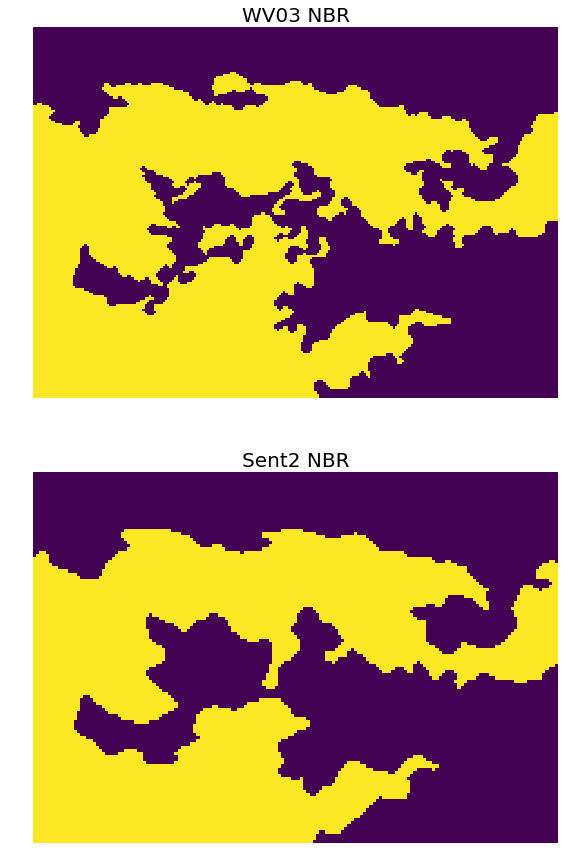

In [17]:
#use Otsu's threshold to identify burnt vs non-burnt regions
nbr_wv03 = np.array(nbr_wv03)
nbr_wv03[np.isnan(nbr_wv03)] = 0
nbr_wv03 = gaussian(nbr_wv03, preserve_range=True)
thresh_wv03 = threshold_otsu(nbr_wv03)
binary_wv03 = nbr_wv03 < thresh_wv03

# clean the binary image
binary_wv03 = nbburntbuildings.clean(binary_wv03)

# see what it looks like and compare to the Sentinel-2 NBR
fig = plt.figure(figsize=(15,15))
fig.add_subplot(2, 1, 1)
plt.axis('off')
plt.title("WV03 NBR", fontsize=20)
plt.imshow(binary_wv03)
fig.add_subplot(2, 1, 2)
plt.axis('off')
plt.title("Sent2 NBR", fontsize=20)
plt.imshow(binary)
plt.show()

***Note**: WV03 image has more detail than Sent2 due to the spatial resolution.

In [18]:
# binary and boolean mask
binary_bool2 = binary_wv03.astype(np.uint8)
mask2 = binary_bool2 != 0

#Vectorization: Rasterio features module to turn the binary (raster) into vector space
shapes2 = features.shapes(binary_bool2, mask=mask2, transform=swir_img.affine)

In [19]:
gj2 = nbburntbuildings.to_geojson(shapes2, buildings_geojson)

In [20]:
with open('wv03_burnt_region.json', 'w') as dst:
    json.dump(gj2, dst)

In [21]:
wv03_burnt_region = os.path.join('/home/gremlin', 'wv03_burnt_region.json')

#Folium map with burnt region (red) and buildings (blue) 
nbburntbuildings.folium_map(wv03_burnt_region, 'WV03 NBR', location=[map_center[1], map_center[0]], tiles=tms_url, attr='DigitalGlobe', map_zoom=16, height='100%', tms=True, zoom_beyond_max=20, max_zoom=20, style_function=lambda x: {
                   'fillOpacity': 0.1, 
                   'fillColor':x['properties']['color'],
                   'color': x['properties']['color'],
                   'weight': 1
               })

The results of this NBR was quite similar to results from the Sentinel-2 NBR. It misclassifies similar areas where there is no burnt vegetation or buildings but this time it does capture a few more burnt trees in the northern part of the image. 

# Method 3: <span style="font-weight:normal">Random Forest Classifier Model</span>

As NBR and obtaining SWIR VHR data has its limitations, we will take advantage of Multispectral Imagery to see if an area can be classified by a Random Forest classifier. Before going through the rest of this Notebook, just for your understanding - we have already performed some of the following steps to our method: 

<ol type="1" style="padding-left:100px;">
    <li>Perform SLIC segmentation filter over Trinity Rd image (captured 3/5/18)</li>
    <li>Volunteered one of our interns to create a dataset and label 1500 segments as a burnt or non-burnt segment</li>
    <li>Created 39 features derived from spectral and texture features in each segment</li>
    <li>Split by 80%/20% for training and test sets</li>
    <li>Trained sklearn Random Forest classifier with following parameters: <code>RandomForestClassifier(n_estimators=50, max_features="log2", max_depth=None, min_samples_split=2, 
                                    bootstrap=True, n_jobs=-1, oob_score=True, warm_start=True, random_state=123)</code></li>
    <li>Tested model to see if over 85% accuracy (result=91.93% accuracy)</li>
    <li>Retrained model on all existing data and tuned n_estimator parameter until better accuracy (selected n_estimator=69 with oob error rate=0.078)</li>
    <li>Save new model to pickle: <code>RandomForestClassifier(n_estimators=69, max_features="log2", max_depth=None, min_samples_split=2, 
                                      bootstrap=True, n_jobs=-1, oob_score=True, warm_start=True, random_state=123)</code></li> 


</ol>


Now that all of the hard work is already done for you, you can go through the rest of the Notebook to try out the model. You may try other images as you choose by going through our catalog (click "Imagery").

## Test RF model
### Step 1: <span style="font-weight:normal">Load model</span>

First we will use the model trained from before. Run the next cell to download and load the model. 

In [22]:
#use pickle of model
model = cPickle.loads(nbburntbuildings.get_model())

### Step 2: <span style="font-weight:normal">Choose AOI within your area of interest and create tiles</span>

This is just to make your image a little smaller before segmenting for the test data. We will select a smaller area of interest in the image captured on 3/5/18 (off nadir is 7.84). 

In [23]:
# AOI chip and extract the RGB image
aoi_bbox = (-122.49674,38.38316, -122.48325,38.39185)
chip = image.aoi(bbox=aoi_bbox) 
rgb = chip.rgb()

In the next cell we will split up the image into 256x256 tiles. This is just for optimizing our test method for the model.

In [24]:
# create 256x256 tiles of AOI chip
tiles = []
for x in range(0,chip.shape[1],256):
    for y in range(0,chip.shape[2],256):
        tiles.append(chip[:,x:x+256,y:y+256])

### Step 3: <span style="font-weight:normal">Make prediction on pixels in tiles</span>
In the next cell we will do a pixel-wise prediction. This will take a few minutes to run. 


For every tile, we will call the function <code>pixels_as_features()</code> to create a test dataset of 65536 samples. Then, we will clean the test dataset for any NaNs or Infs. After that, we will append to a list the prediction for every pixel in the tile.

In [25]:
# compute pixel-wise prediction for each tile
predictions_2d = [] 
for tile in tqdm.tqdm_notebook(tiles):
    #create test dataset
    x_test = nbburntbuildings.pixels_as_features(tile)
    
    #clean the test dataset
    loc_nans = np.isnan(x_test)
    loc_infs = np.isinf(x_test)
    x_test[loc_nans] = 0
    x_test[loc_infs] = 0
    
    #make pixel-wise prediction
    predictions_2d.append(model.predict(x_test).reshape(tile.shape[1], tile.shape[2]))


### Step 4: <span style="font-weight:normal">Create and clean the new binary mask</span>


Run the next few cells to reshape the list of predictions and create a new binary mask. 

In [26]:
# puts tiles' masks together to rebuild binary image
new_mask = nbburntbuildings.create_mask(predictions_2d, len(range(0,chip.shape[1],256)), len(range(0,chip.shape[2],256)), chip.shape)

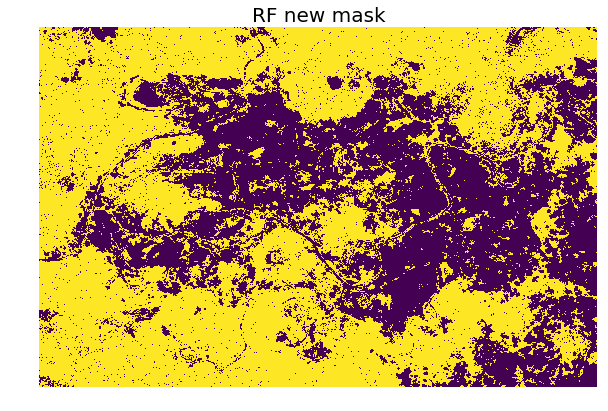

In [27]:
plt.figure(figsize=(10,10))
plt.axis('off')
plt.title("RF new mask", fontsize=20)
plt.imshow(new_mask)

Above is the result of the new mask. It is a little noisy so we will run some operations from scikit-image's morphology module to clean it up: <code>remove_small_holes</code> and <code>remove_small_objects</code>

In [28]:
# clean the new mask. you can change the '500' parameter to see how this works
new_mask_clean = morphology.remove_small_holes(new_mask==1.0, 500) 
new_mask_clean = morphology.remove_small_objects(new_mask_clean, 500) 

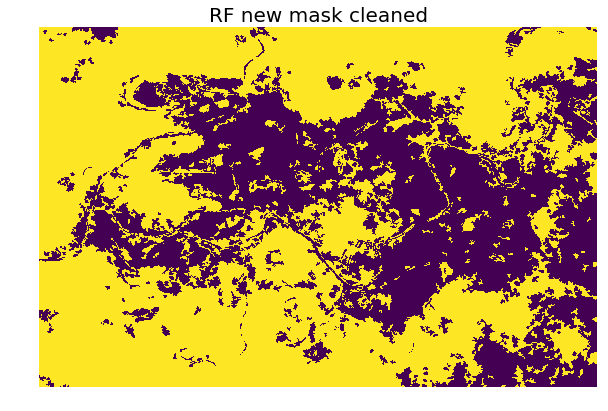

In [29]:
plt.figure(figsize=(10,10))
plt.axis('off')
plt.title("RF new mask cleaned", fontsize=20)
plt.imshow(new_mask_clean)

Looking good! You can play with the parameter in <code>remove_small_holes</code> and <code>remove_small_objects</code> to clean up the image as you desire.

Just to make some comparisons: Run the next cell to see how this new mask compares to the binaries from the two previous NBR methods.

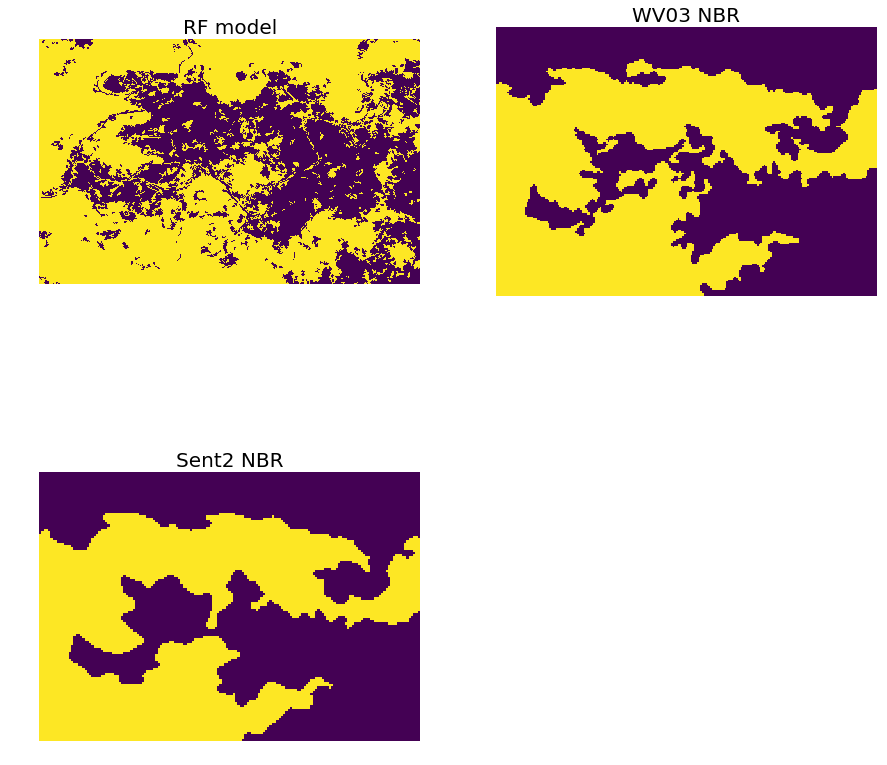

In [60]:
# compare RF mask, WV03 NBR mask, and Sent2 NBR mask
fig = plt.figure(figsize=(15,15))
fig.add_subplot(2, 2, 1)
plt.axis('off')
plt.title("RF model", fontsize=20)
plt.imshow(new_mask_clean)
fig.add_subplot(2, 2, 2)
plt.axis('off')
plt.title("WV03 NBR", fontsize=20)
plt.imshow(binary_wv03)
fig.add_subplot(2, 2, 3)
plt.axis('off')
plt.title("Sent2 NBR", fontsize=20)
plt.imshow(binary)
plt.show()

You can interpret these however you like, but it is quite clear that the RF model has a lot more detail due to its pixel-wise prediction.

### Step 5: <span style="font-weight:normal">Segment your AOI image</span>


To segment the image, you will use Skimage's segmentation <code>slic()</code> function. You may try other segmentation filter methods of your choosing, but for this we have decided to use <code>slic()</code> as it had been able to segment individual trees and roads pretty well. Run the next two cells and change the parameters to see how this will look. 

In [31]:
#Segment image
img_segmented = segmentation.slic(rgb, n_segments=2000, compactness=10, sigma=1)

Number of segments: 965


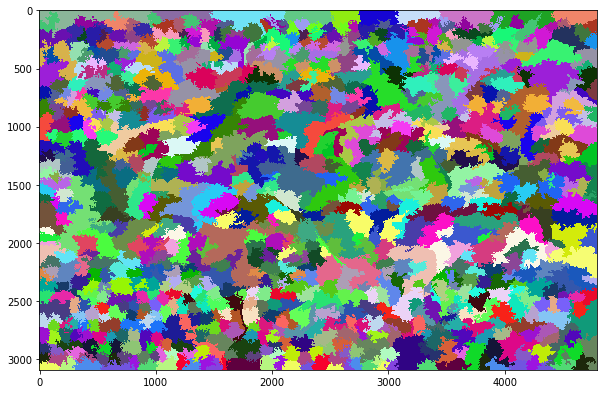

In [32]:
np.random.seed(0) #keep same colors
cmap = matplotlib.colors.ListedColormap(np.random.rand(256,3))
plt.figure(figsize=(10,10))
plt.imshow(img_segmented, cmap=cmap)
print "Number of segments:", np.max(img_segmented)

Run the next cell below to see how the segments break up the RGB image. 

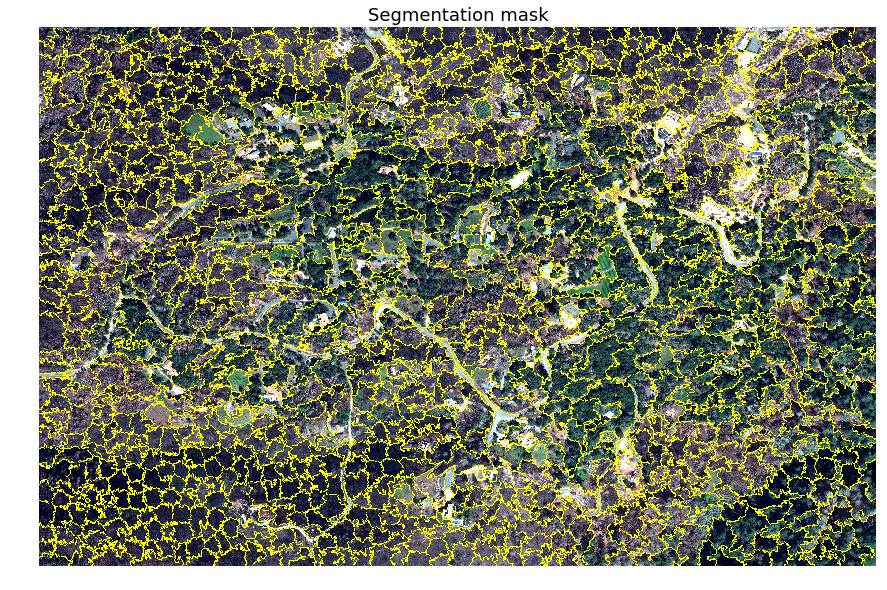

In [33]:
sp = plt.figure(figsize=(15,15))
nbburntbuildings.plot_array(segmentation.mark_boundaries(rgb, img_segmented, mode='thick', outline_color=(255, 255, 0)), (1,1,1), title="Segmentation mask")
_ = plt.plot()

### Step 6: <span style="font-weight:normal">Determine Segments with >50% burnt pixels</span>

Now given our new cleaned mask, we will find which of these segments have a more than 50% pixels identified as the burnt region.

In [34]:
burnt_regions = [r.label for r in measure.regionprops(img_segmented, intensity_image=new_mask) if r.mean_intensity > 0.5]

In [35]:
burnt_segments = np.isin(img_segmented, burnt_regions)

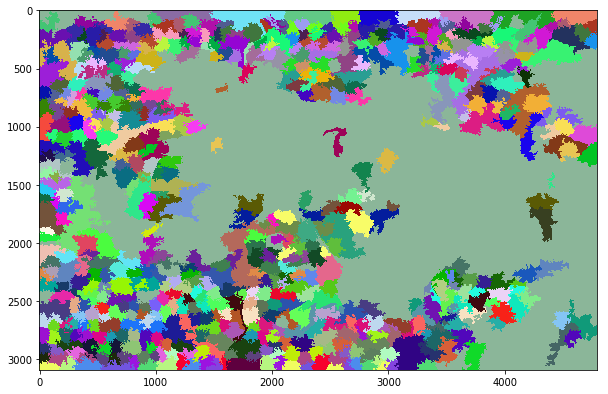

In [36]:
plt.figure(figsize=(10,10))
plt.imshow(burnt_segments*img_segmented, cmap=cmap)


Above is how the segments will look with the new mask. The largest segment is the area that has not been burnt from the fire. 

Run the next cell to see how this will look on the RGB image.

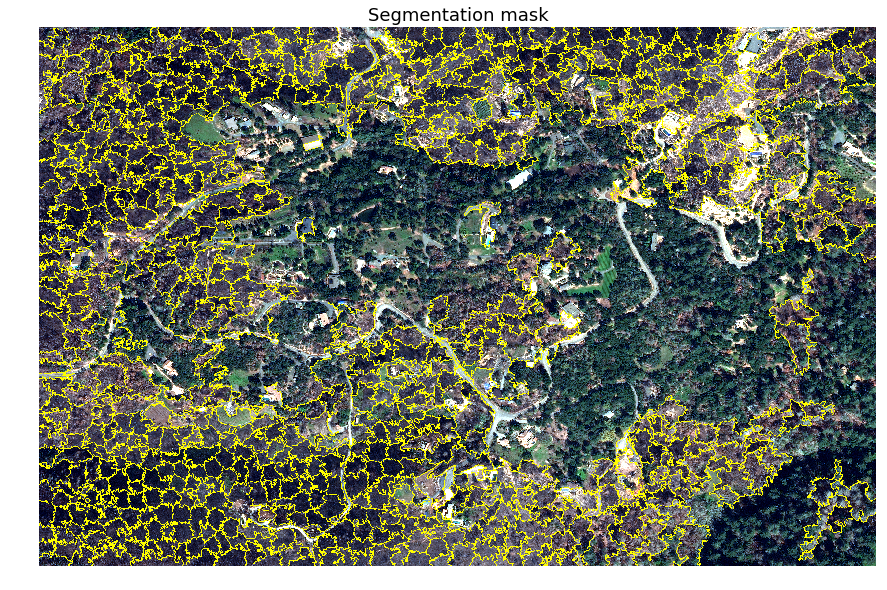

In [37]:
sp = plt.figure(figsize=(15,15))
nbburntbuildings.plot_array(segmentation.mark_boundaries(rgb, burnt_segments*img_segmented, mode='thick', outline_color=(255, 255, 0)), (1,1,1), title="Segmentation mask")
_ = plt.plot()

### Step 7: <span style="font-weight:normal">Vectorize image mask then visualize result</span>


Again, we will vectorize the binary, create a new geojson, and display the result on Folium. You can run through the next 5 cells to see this result. 

In [38]:
from rasterio import features

#binary mask
binary_bool3 = burnt_segments.astype(np.uint8)

#simplify geometries before storing as shapes 
shapes3 = [(shapely.geometry.shape(g).simplify(chip.affine.a), v) for g, v in features.shapes(binary_bool3, mask=burnt_segments, transform=chip.affine)]

In [39]:
with open('/home/gremlin/Nuns_SonomaCounty_Glenn_selected.geojson') as f:
    nuns_geojson = json.load(f)

In [40]:
gj3 = nbburntbuildings.to_geojson(shapes3, nuns_geojson)

In [41]:
with open('RF_burnt_region.json', 'w') as dst:
    json.dump(gj3, dst)

In [42]:
RF_burnt_region = os.path.join('/home/gremlin', 'RF_burnt_region.json')

#Folim map burnt region (red), buildings (blue)
nbburntbuildings.folium_map(RF_burnt_region, 'WV03 NBR', location=[map_center[1], map_center[0]], tiles=tms_url, attr='DigitalGlobe', map_zoom=16, height='100%', tms=True, zoom_beyond_max=20, max_zoom=20, style_function=lambda x: {
                   'fillOpacity': 0.1, 
                   'fillColor':x['properties']['color'],
                   'color': x['properties']['color'],
                   'weight': 1
               })

As you can see, the model behaves a lot differently from the NBR algorithm but it was able to classify burnt regions correctly. Towards the northwest you can see an area that has green patches of grass around a few buildings that were correctly identified as not burnt, in which our NBR methods could not do. Although it may not look perfect, the model can be retrained and retuned to perform with even better accuracy. 

### Step 8: <span style="font-weight:normal">Identify destroyed and unharmed buildings</span>
In order to identify the buildings as destroyed or unharmed, we will convert the geojson created from before into Shapely Polygons. Then we will find intersections between building footprint Polygons and the burnt regions Polygons.

In [43]:
#load the json created from before
with open('/home/gremlin/RF_burnt_region.json') as f:
    js_ = json.load(f)
    

In [44]:
#check if building intersects any of the burnt regions and label 'blue' (True) if intersect
burnt_polys, building_polys = nbburntbuildings.geojson_to_polygons(js_)
nbburntbuildings.label_building_polys(burnt_polys, building_polys)
    

Once you have converted the geojson to polygons and labelled your buildings, we will then rewrite the <code>to_geojson()</code> function to convert the Polygons into geojson for visualizing in the Folium map. 

In [45]:
gj4 = nbburntbuildings.to_geojson_burnt(burnt_polys, building_polys)

In [46]:
with open('RF_burnt_buildings_region.json', 'w') as dst:
    json.dump(gj4, dst)

In [47]:
RF_burnt_buildings_region = os.path.join('/home/gremlin', 'RF_burnt_buildings_region.json')

nbburntbuildings.folium_map(RF_burnt_buildings_region, 'RF model', location=[map_center[1], map_center[0]], tiles=tms_url, attr='DigitalGlobe', map_zoom=16, height='100%', tms=True, zoom_beyond_max=20, max_zoom=20, style_function=lambda x: {
                   'fillOpacity': 0.1, 
                   'fillColor':x['properties']['color'],
                   'color': x['properties']['color'],
                   'weight': 1
               })

Above you can see which buildings have been classified as <span style="color:blue">**destroyed**</span> or <span style="color:gold">**unharmed**</span>.

# Discussion of Results

Now we will make some comparisons of each method to to see how many buildings were identified as destroyed or unharmed. In this section, we will also compare the ground truth to our results from the RF classification.

### Ground Truth Map
For the ground truth, we will again volunteer one of our interns to label every building as best as possible to create the map. You can view the ground truth geojson [here](https://github.com/aalten77/nbburntbuildings/blob/master/data/Nuns_SonomaCounty_Glenn_selected_labelled.geojson). This ground truth may not be truly accurate, but it is a good way to compare how our predicted map compares to what the intern will predict. Run through the next 5 cells to see the Folium map. 

If you would like to cross-check the ground truth map created in our geojson, you may click on this [link](https://data-sonomamap.opendata.arcgis.com/datasets/calfire-damage-assessment-2017?orderBy=IncidentName) to see the CAL FIRE structure damage assessment of the October 2017 Sonoma Complex Fires. You can also see CAL FIRE's interactive map by clicking [here](http://calfire-forestry.maps.arcgis.com/apps/PublicInformation/index.html?appid=5bbcbed430ad45e5a38e6be155ef5fec). The newly labelled building footprint ground truth was validated with this damage assessment.

In [48]:
with open('/home/gremlin/Nuns_SonomaCounty_Glenn_selected_labelled.geojson') as f:
    data_labelled = json.load(f)

In [49]:
#adding some color for the buildings in groundtruth geojson
for feat in data_labelled['features']:
    if feat['properties']['Burnt_Label']:
        feat['properties']['color'] = 'blue'
    else:
        feat['properties']['color'] = 'yellow'

In [50]:
gj5 = nbburntbuildings.to_geojson_groundtruth(burnt_polys, data_labelled)

In [51]:
with open('ground_truth_burnt_buildings.json', 'w') as dst:
    json.dump(gj5, dst)

In [52]:
groundtruth_burnt_region = os.path.join('/home/gremlin', 'ground_truth_burnt_buildings.json')

nbburntbuildings.folium_map(groundtruth_burnt_region, 'Ground Truth', location=[map_center[1], map_center[0]], tiles=tms_url, attr='DigitalGlobe', map_zoom=16, height='100%', tms=True, zoom_beyond_max=18, max_zoom=20, style_function=lambda x: {
                   'fillOpacity': 0.1, 
                   'fillColor':x['properties']['color'],
                   'color': x['properties']['color'],
                   'weight': 1
               })

### Accuracy Measures

Now to compare some results, you can run the next few cells to obtain a confusion matrix and accuracy measures for the destroyed and unharmed buildings. 

In [53]:
# get polygons for sentinel2 nbr and wv03 nbr
with open('/home/gremlin/sentinel2_burnt_region.json') as f:
    js_sent2 = json.load(f)
    
with open('/home/gremlin/wv03_burnt_region.json') as f:
    js_wv03 = json.load(f)


In [54]:
#check if building intersects any of the burnt regions and label 'blue' if intersect
burnt_polys_sent2, building_polys_sent2 = nbburntbuildings.geojson_to_polygons(js_sent2)
burnt_polys_wv03, building_polys_wv03 = nbburntbuildings.geojson_to_polygons(js_wv03)
burnt_polys_groundtruth, building_polys_groundtruth = nbburntbuildings.geojson_to_polygons_groundtruth(gj5)

#label buildings for Sentinel-2 NBR method and WorldView-3 NBR method
nbburntbuildings.label_building_polys(burnt_polys_sent2, building_polys_sent2)
nbburntbuildings.label_building_polys(burnt_polys_wv03, building_polys_wv03)

In [55]:
#get the ground truth and predictions for comparison
trues = [(x[1][0],x[1][2]) for x in building_polys_groundtruth]
predictions = [(x[1][0],x[1][2]) for x in building_polys]
predictions_sent2 = [(x[1][0],x[1][1]=='blue') for x in building_polys_sent2]
predictions_wv03 = [(x[1][0],x[1][1]=='blue') for x in building_polys_wv03]

In [56]:
#some statistics
print "RF model accuracy measures: "
acc, prec, recall = nbburntbuildings.accuracy_measures([p[1] for p in predictions], [t[1] for t in trues])
print "Sentinel-2 NBR model accuracy measures: "
acc_sent2, prec_sent2, recall_sent2 = nbburntbuildings.accuracy_measures([p[1] for p in predictions_sent2], [t[1] for t in trues])
print "WorldView-3 NBR model accuracy measures: "
acc_wv03, prec_wv03, recall_wv03 = nbburntbuildings.accuracy_measures([p[1] for p in predictions_wv03], [t[1] for t in trues])

RF model accuracy measures: 
	(tn, fp, fn, tp) = (32, 10, 2, 29)
	Accuracy = 83.56%
	Misclassification Rate = 16.44%
	True Positive Rate = 93.55%
	False Positive Rate = 23.81%
	Specificity = 76.19%
	Precision = 74.36%
	Prevalence = 42.47%

Sentinel-2 NBR model accuracy measures: 
	(tn, fp, fn, tp) = (26, 16, 2, 29)
	Accuracy = 75.34%
	Misclassification Rate = 24.66%
	True Positive Rate = 93.55%
	False Positive Rate = 38.10%
	Specificity = 61.90%
	Precision = 64.44%
	Prevalence = 42.47%

WorldView-3 NBR model accuracy measures: 
	(tn, fp, fn, tp) = (13, 29, 2, 29)
	Accuracy = 57.53%
	Misclassification Rate = 42.47%
	True Positive Rate = 93.55%
	False Positive Rate = 69.05%
	Specificity = 30.95%
	Precision = 50.00%
	Prevalence = 42.47%



In [57]:
nbburntbuildings.displayHTMLtable(acc_sent2, acc_wv03, acc, prec_sent2, prec_wv03, prec, recall_sent2, recall_wv03, recall)

Sent2 NBR,75.34%,64.44%,93.55%
WV03 NBR,57.53%,50.00%,93.55%
WV03 RF,83.56%,74.36%,93.55%


In the two cells above you can find the confusion matrix for the destroyed and unharmed buildings. Here we can see that the accuracy is 83.56% which is better than the NBR methods mentioned previously. Precision is the highest among all three as well at 74.36% meaning it is better at predicting which buildings have been destroyed. It is interesting to note that the recall rate is exactly the same for all three at 93.55%. 

# Conclusion

In this Notebook, we explored the feasibility of using machine learning approaches in combination with 8-band WorldView-3 imagery to  delineate fire damaged areas, and to compare those results to more established remote-sensing methods dependent on SWIR imagery. Through our exploration, we have demonstrated that our new method is at least as effective, if not better, at delineating burn scars for this small area of interest.

This opens up the opportunity to use additional VHR imagery sources for post-fire damage assessments in the critical period following a forest fire event. While our preliminary results show that the Random Forest model performs very well during training and testing on a single image, in future work, we would like to extend this analysis to explore making the model more robust and generally applicable to a broader set of images.